<p style="text-align:center">
    <a href="https://skills.network" target="_blank">
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="200" alt="Skills Network Logo"  />
    </a>
</p>


# **Data Visualization**


Estimated time needed: **45** minutes


In this lab, you will focus on data visualization. The dataset will be provided through an RDBMS, and you will need to use SQL queries to extract the required data.


## Objectives


After completing this lab, you will be able to:


-   Visualize the distribution of data.

-   Visualize the relationship between two features.

-   Visualize composition and comparison of data.




## Demo: How to work with database


Download the database file.


In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv

--2025-08-23 20:47:05--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
200 OKequest sent, awaiting response... 
Length: 159525875 (152M) [text/csv]
Saving to: ‘survey-data.csv’

survey-data.csv     100%[===================>] 152.13M  58.9MB/s    in 2.6s    

2025-08-23 20:47:09 (58.9 MB/s) - ‘survey-data.csv’ saved [159525875/159525875]



**Install and Import Necessary Python Libraries**

Ensure that you have the required libraries installed to work with SQLite and Pandas:


In [2]:
!pip install pandas 
!pip install matplotlib

import pandas as pd
import matplotlib.pyplot as plt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 159.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 194.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 149.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 100.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 88.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 145.7 MB/s eta 0:00:00


**Read the CSV File into a Pandas DataFrame**

Load the Stack Overflow survey data into a Pandas DataFrame:


In [3]:
# Read the CSV file
df = pd.read_csv('survey-data.csv')

# Display the first few rows of the data
df.head()


,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,3,I am a developer by profession,45-54 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,NaN,NaN
3,4,I am learning to code,18-24 years old,"Student, full-time",NaN,Apples,NaN,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Easy,NaN,NaN
4,5,I am a developer by profession,18-24 years old,"Student, full-time",NaN,Apples,NaN,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Too short,Easy,NaN,NaN


**Create a SQLite Database and Insert the Data**

Now, let's create a new SQLite database (`survey-data.sqlite`) and insert the data from the DataFrame into a table using the sqlite3 library:


In [4]:
import sqlite3

# Create a connection to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# Write the dataframe to the SQLite database
df.to_sql('main', conn, if_exists='replace', index=False)


# Close the connection
conn.close()


**Verify the Data in the SQLite Database**
Verify that the data has been correctly inserted into the SQLite database by running a simple query:


In [5]:
# Reconnect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# Run a simple query to check the data
QUERY = "SELECT * FROM main LIMIT 5"
df_check = pd.read_sql_query(QUERY, conn)

# Display the results
print(df_check)


   ResponseId                      MainBranch                 Age  \
0           1  I am a developer by profession  Under 18 years old   
1           2  I am a developer by profession     35-44 years old   
2           3  I am a developer by profession     45-54 years old   
3           4           I am learning to code     18-24 years old   
4           5  I am a developer by profession     18-24 years old   

            Employment RemoteWork   Check  \
0  Employed, full-time     Remote  Apples   
1  Employed, full-time     Remote  Apples   
2  Employed, full-time     Remote  Apples   
3   Student, full-time       None  Apples   
4   Student, full-time       None  Apples   

                                    CodingActivities  \
0                                              Hobby   
1  Hobby;Contribute to open-source projects;Other...   
2  Hobby;Contribute to open-source projects;Other...   
3                                               None   
4                                 

## Demo: Running an SQL Query


Count the number of rows in the table named 'main'


In [6]:
QUERY = """
SELECT COUNT(*) 
FROM main
"""
df = pd.read_sql_query(QUERY, conn)
df.head()


,COUNT(*)
0,65437


## Demo: Listing All Tables


To view the names of all tables in the database:


In [7]:
QUERY = """
SELECT name as Table_Name FROM sqlite_master 
WHERE type = 'table'
"""
pd.read_sql_query(QUERY, conn)


,Table_Name
0,main


## Demo: Running a Group By Query
    
For example, you can group data by a specific column, like Age, to get the count of respondents in each age group:


In [8]:
QUERY = """
SELECT Age, COUNT(*) as count
FROM main
GROUP BY Age
ORDER BY Age
"""
pd.read_sql_query(QUERY, conn)


,Age,count
0,18-24 years old,14098
1,25-34 years old,23911
2,35-44 years old,14942
3,45-54 years old,6249
4,55-64 years old,2575
5,65 years or older,772
6,Prefer not to say,322
7,Under 18 years old,2568


## Demo: Describing a table

Use this query to get the schema of a specific table, main in this case:


In [9]:
table_name = 'main'

QUERY = """
SELECT sql FROM sqlite_master 
WHERE name= '{}'
""".format(table_name)

df = pd.read_sql_query(QUERY, conn)
print(df.iat[0,0])


CREATE TABLE "main" (
"ResponseId" INTEGER,
  "MainBranch" TEXT,
  "Age" TEXT,
  "Employment" TEXT,
  "RemoteWork" TEXT,
  "Check" TEXT,
  "CodingActivities" TEXT,
  "EdLevel" TEXT,
  "LearnCode" TEXT,
  "LearnCodeOnline" TEXT,
  "TechDoc" TEXT,
  "YearsCode" TEXT,
  "YearsCodePro" TEXT,
  "DevType" TEXT,
  "OrgSize" TEXT,
  "PurchaseInfluence" TEXT,
  "BuyNewTool" TEXT,
  "BuildvsBuy" TEXT,
  "TechEndorse" TEXT,
  "Country" TEXT,
  "Currency" TEXT,
  "CompTotal" REAL,
  "LanguageHaveWorkedWith" TEXT,
  "LanguageWantToWorkWith" TEXT,
  "LanguageAdmired" TEXT,
  "DatabaseHaveWorkedWith" TEXT,
  "DatabaseWantToWorkWith" TEXT,
  "DatabaseAdmired" TEXT,
  "PlatformHaveWorkedWith" TEXT,
  "PlatformWantToWorkWith" TEXT,
  "PlatformAdmired" TEXT,
  "WebframeHaveWorkedWith" TEXT,
  "WebframeWantToWorkWith" TEXT,
  "WebframeAdmired" TEXT,
  "EmbeddedHaveWorkedWith" TEXT,
  "EmbeddedWantToWorkWith" TEXT,
  "EmbeddedAdmired" TEXT,
  "MiscTechHaveWorkedWith" TEXT,
  "MiscTechWantToWorkWith" TEXT,


## Hands-on Lab


### Visualizing the Distribution of Data

**Histograms**

Plot a histogram of CompTotal (Total Compensation).


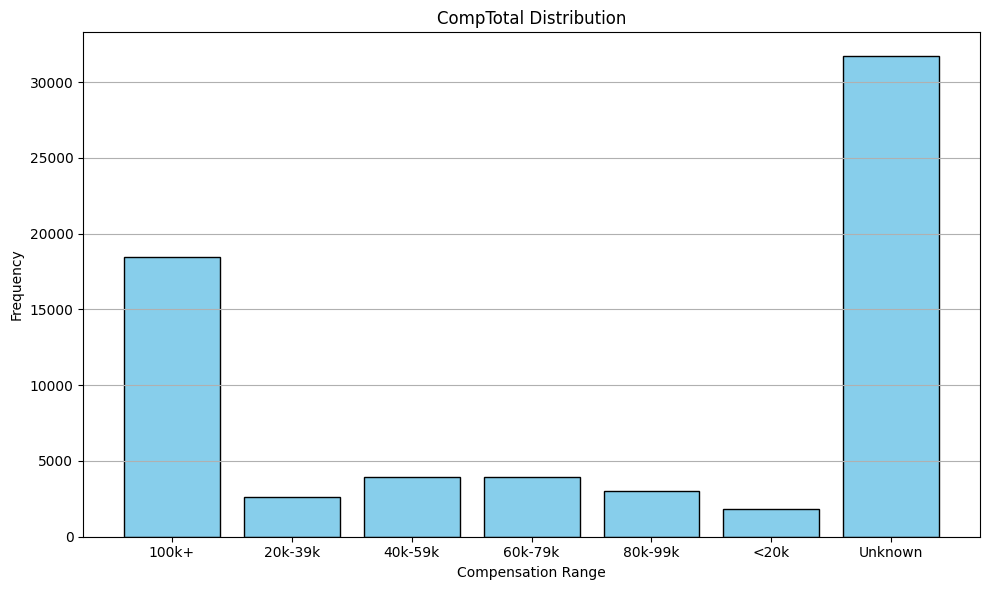

In [12]:
## Write your code here
query = """
SELECT 
  CASE 
    WHEN CompTotal < 20000 THEN '<20k'
    WHEN CompTotal BETWEEN 20000 AND 39999 THEN '20k-39k'
    WHEN CompTotal BETWEEN 40000 AND 59999 THEN '40k-59k'
    WHEN CompTotal BETWEEN 60000 AND 79999 THEN '60k-79k'
    WHEN CompTotal BETWEEN 80000 AND 99999 THEN '80k-99k'
    WHEN CompTotal >= 100000 THEN '100k+'
    ELSE 'Unknown'
  END AS CompTotalRange,
  COUNT(*) AS Frequency
FROM main
GROUP BY CompTotalRange
ORDER BY CompTotalRange
"""

# Run the query and load into a DataFrame
df = pd.read_sql_query(query, conn)

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(df['CompTotalRange'], df['Frequency'], color='skyblue', edgecolor='black')
plt.title('CompTotal Distribution')
plt.xlabel('Compensation Range')
plt.ylabel('Frequency')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Close the connection
conn.close()


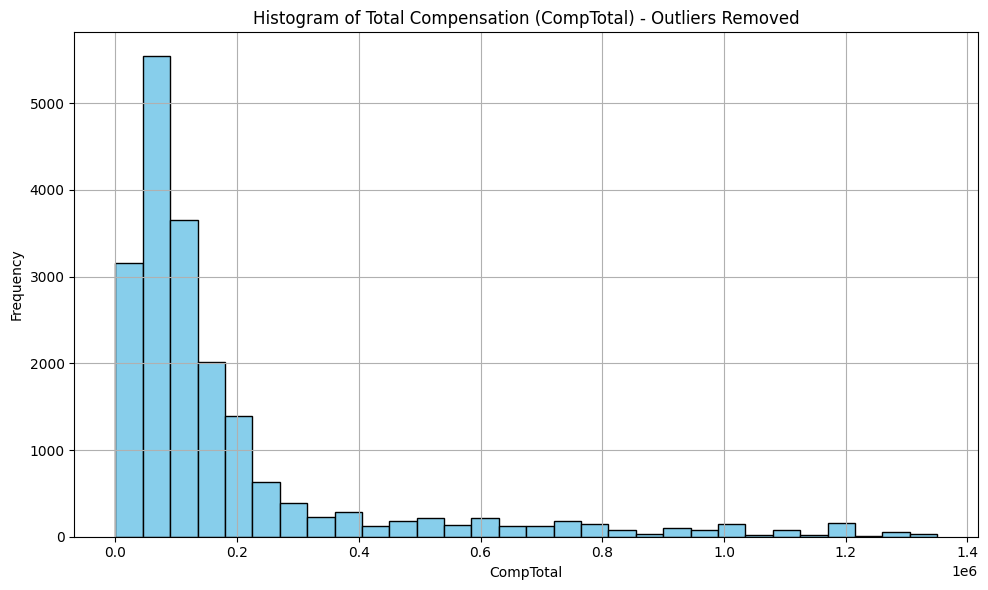

In [50]:

df = df.dropna(subset=['CompTotal'])


# Optional: Filter out extreme outliers (e.g., above 90th percentile)
upper_limit = df['CompTotal'].quantile(0.90)
df_filtered = df[df['CompTotal'] <= upper_limit]

# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(df_filtered['CompTotal'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of Total Compensation (CompTotal) - Outliers Removed')
plt.xlabel('CompTotal')
plt.ylabel('Frequency')
plt.grid(True)
plt.tight_layout()
plt.show()





**Box Plots**

Plot a box plot of Age.


In [19]:
## Write your code here
# Reconnect to the database
conn = sqlite3.connect('survey-data.sqlite')

query = """
SELECT distinct Age
FROM main
GROUP BY Age
ORDER BY Age

"""
pd.read_sql_query(query, conn)

,Age
0,18-24 years old
1,25-34 years old
2,35-44 years old
3,45-54 years old
4,55-64 years old
5,65 years or older
6,Prefer not to say
7,Under 18 years old


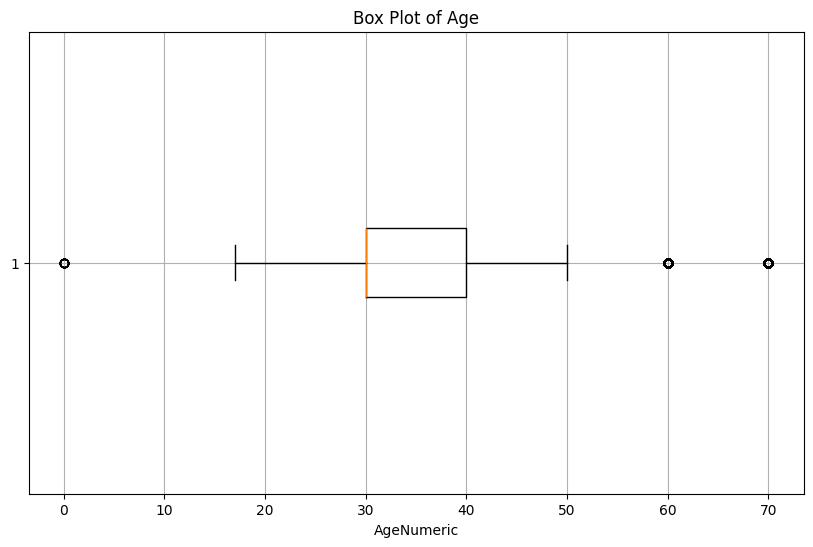

In [21]:

# Load data from the table
df = pd.read_sql_query("SELECT distinct * FROM main", conn)

# Map Age to numeric (example: if Age is categorical like '25-34', '35-44', etc.)
age_map = {
    'Under 18 years old': 17,
    '18-24 years old': 21,
    '25-34 years old': 30,
    '35-44 years old': 40,
    '45-54 years old': 50,
    '55-64 years old': 60,
    '65 years or older': 70,
    'Prefer not to say': 0
}
df['AgeNumeric'] = df['Age'].map(age_map)

# Drop rows with missing values
df = df.dropna(subset=['AgeNumeric', 'CompTotal'])

# Plot box plot
plt.figure(figsize=(10, 6))
plt.boxplot(df['AgeNumeric'], vert=False)
plt.title('Box Plot of Age')
plt.xlabel('AgeNumeric')
plt.grid(True)
plt.show()


### Visualizing Relationships in Data

**Scatter Plots**

Create a scatter plot of Age and WorkExp.


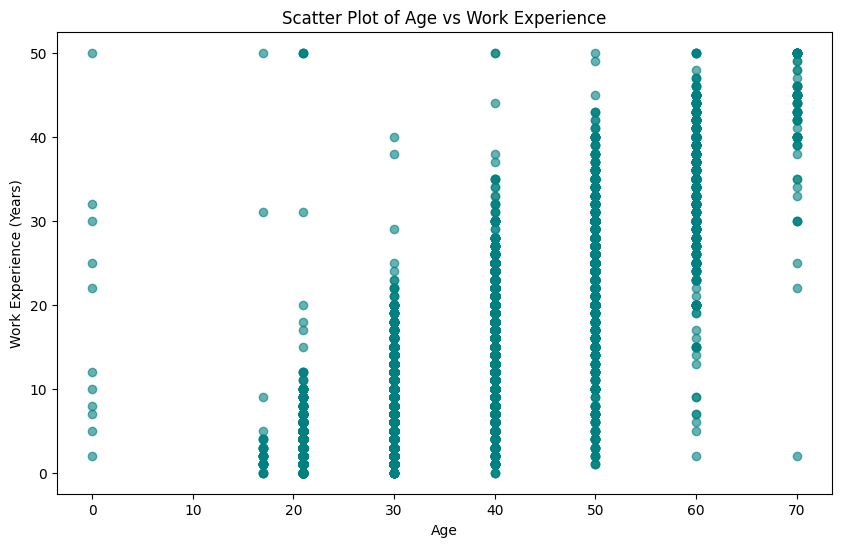

In [23]:
## Write your code here

# Drop missing values
df = df.dropna(subset=['AgeNumeric', 'WorkExp'])

# Plot scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df['AgeNumeric'], df['WorkExp'], alpha=0.6, color='teal')
plt.title('Scatter Plot of Age vs Work Experience')
plt.xlabel('Age')
plt.ylabel('Work Experience (Years)')
plt.grid(False)
plt.show()


**Bubble Plots**

Create a bubble plot of `TimeSearching` and `Frustration` using the Age column as the bubble size.


/tmp/ipykernel_300/3341672944.py:13: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


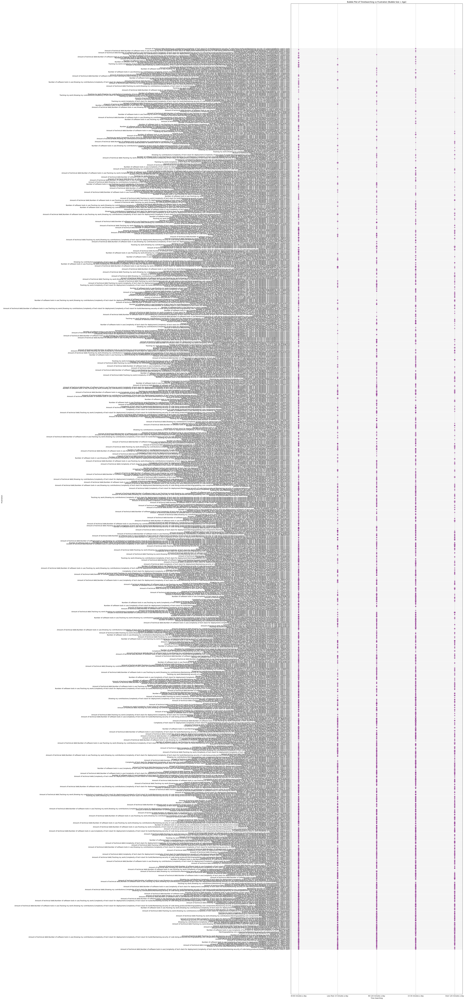

In [28]:
## Write your code here

# Drop missing values
df = df.dropna(subset=['AgeNumeric', 'TimeSearching', 'Frustration'])

# Create bubble plot
plt.figure(figsize=(20, 116))
plt.scatter(df['TimeSearching'], df['Frustration'], s=df['AgeNumeric']*2, alpha=0.6, color='purple', edgecolors='w')
plt.title('Bubble Plot of TimeSearching vs Frustration (Bubble Size = Age)')
plt.xlabel('Time Searching')
plt.ylabel('Frustration')
plt.grid(True)
plt.tight_layout()
plt.show()


### Visualizing Composition of Data

**Pie Charts**

Create a pie chart of the top 5 databases(`DatabaseWantToWorkWith`) that respondents wish to learn next year.


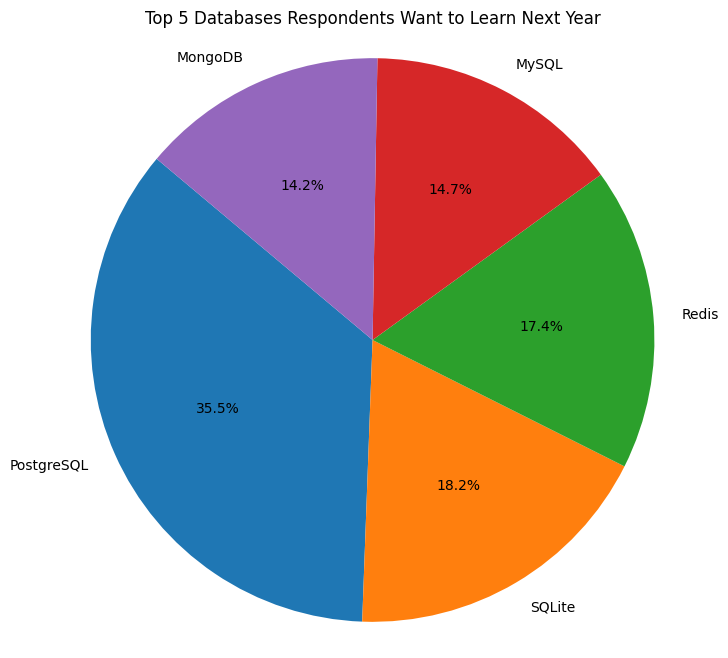

In [30]:
## Write your code here

# Split multiple entries (assuming comma-separated values)

df['DatabaseList'] = df['DatabaseWantToWorkWith'].str.split(';')

# Flatten the list of databases
all_databases = df.explode('DatabaseList')
all_databases['DatabaseList'] = all_databases['DatabaseList'].str.strip()

# Count the top 5 databases
top_databases = all_databases['DatabaseList'].value_counts().nlargest(5)

# Plot pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_databases, labels=top_databases.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Databases Respondents Want to Learn Next Year')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular
plt.show()


**Stacked Charts** 

Create a stacked bar chart of median `TimeSearching` and `TimeAnswering` for the age group 30 to 35.


In [34]:
df['TimeSearching'].unique()

array(['30-60 minutes a day', 'Less than 15 minutes a day',
       '60-120 minutes a day', '15-30 minutes a day',
       'Over 120 minutes a day'], dtype=object)

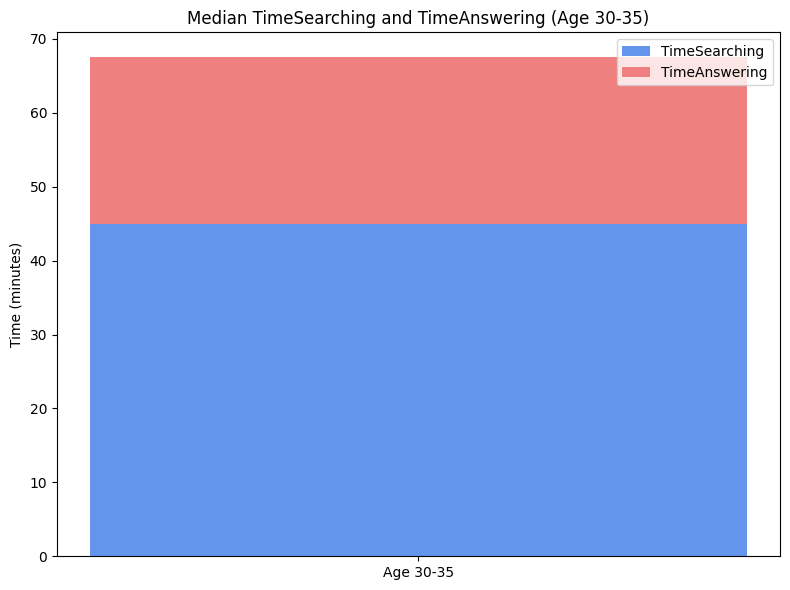

In [36]:
## Write your code here

# Map time categories to numeric values (in minutes)
time_map = {
    'Less than 15 minutes a day': 10,
    '15-30 minutes a day': 22.5,
    '30-60 minutes a day': 45,
    '60-120 minutes a day': 90,
    'Over 120 minutes a day': 150
}
df['TimeSearchingNumeric'] = df['TimeSearching'].map(time_map)
df['TimeAnsweringNumeric'] = df['TimeAnswering'].map(time_map)

# Filter for age group 30 to 35
df_filtered = df[(df['AgeNumeric'] >= 30) & (df['AgeNumeric'] <= 35)]

# Drop missing values
df_filtered = df_filtered.dropna(subset=['TimeSearching', 'TimeAnswering'])


# Compute medians
median_searching = df_filtered['TimeSearchingNumeric'].median()
median_answering = df_filtered['TimeAnsweringNumeric'].median()

# Create stacked bar chart
plt.figure(figsize=(8, 6))
plt.bar('Age 30-35', median_searching, label='TimeSearching', color='cornflowerblue')
plt.bar('Age 30-35', median_answering, bottom=median_searching, label='TimeAnswering', color='lightcoral')
plt.title('Median TimeSearching and TimeAnswering (Age 30-35)')
plt.ylabel('Time (minutes)')
plt.legend()
plt.tight_layout()
plt.show()


In [40]:
print(f"the median for timesearching is:{median_searching}") 
print(f"the median for Timeanswering is: {median_answering}")

the median for timesearching is:45.0
the median for Timeanswering is: 22.5


### Visualizing Comparison of Data

**Line Chart**

Plot the median `CompTotal` for all ages from 45 to 60.


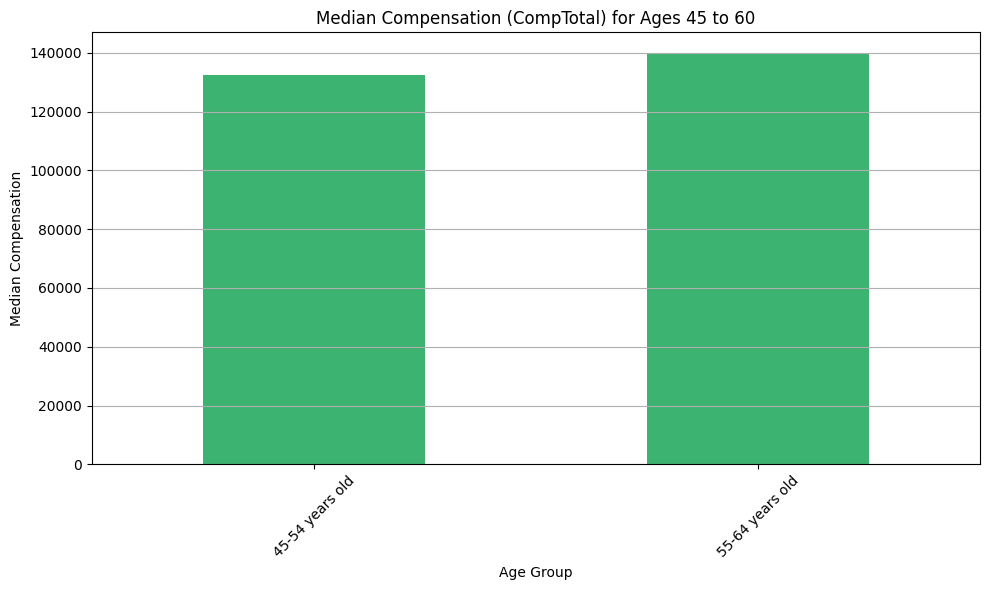

In [41]:
## Write your code here

# Filter for age groups between 45 and 60
df_filtered = df[(df['AgeNumeric'] >= 45) & (df['AgeNumeric'] <= 60)]

# Drop missing values
df_filtered = df_filtered.dropna(subset=['AgeNumeric', 'CompTotal'])

# Group by Age and calculate median CompTotal
median_comp = df_filtered.groupby('Age')['CompTotal'].median().sort_index()

# Plot the results
plt.figure(figsize=(10, 6))
median_comp.plot(kind='bar', color='mediumseagreen')
plt.title('Median Compensation (CompTotal) for Ages 45 to 60')
plt.xlabel('Age Group')
plt.ylabel('Median Compensation')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()




**Bar Chart**

Create a horizontal bar chart using the `MainBranch` column.


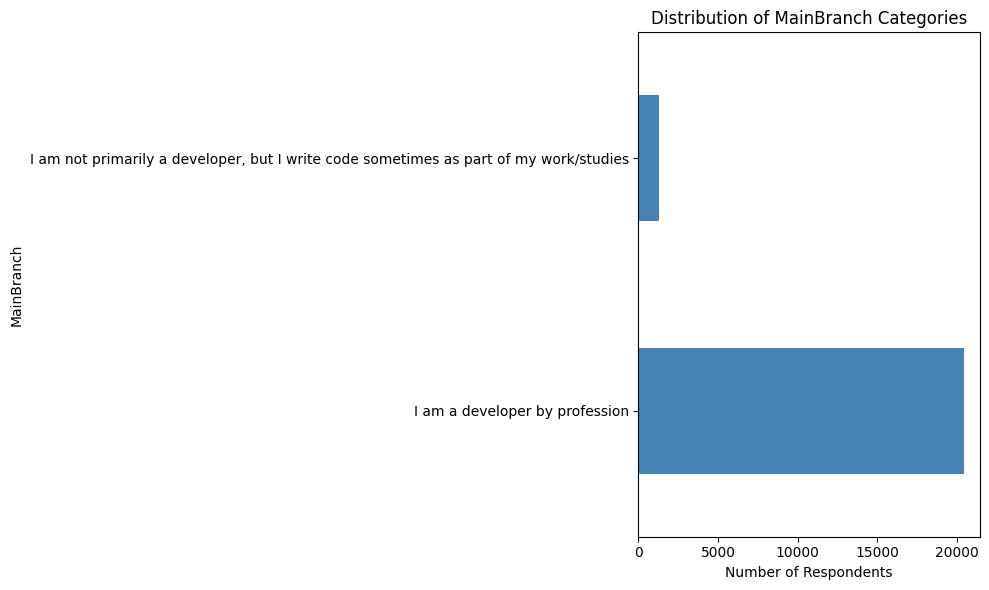

In [42]:
## Write your code here

# Drop missing values
df = df.dropna(subset=['MainBranch'])

# Count frequency of each category
branch_counts = df['MainBranch'].value_counts()

# Plot horizontal bar chart
plt.figure(figsize=(10, 6))
branch_counts.plot(kind='barh', color='steelblue')
plt.title('Distribution of MainBranch Categories')
plt.xlabel('Number of Respondents')
plt.ylabel('MainBranch')
plt.tight_layout()
plt.show()


### Summary


In this lab, you focused on extracting and visualizing data from an RDBMS using SQL queries and SQLite. You applied various visualization techniques, including:

- Histograms to display the distribution of CompTotal.
- Box plots to show the spread of ages.
- Scatter plots and bubble plots to explore relationships between variables like Age, WorkExp, `TimeSearching` and `TimeAnswering`.
- Pie charts and stacked charts to visualize the composition of data.
- Line charts and bar charts to compare data across categories.


### Close the Database Connection

Once the lab is complete, ensure to close the database connection:


In [52]:
conn.close()

## Authors:
Ayushi Jain


### Other Contributors:
- Rav Ahuja
- Lakshmi Holla
- Malika


Copyright © IBM Corporation. All rights reserved.
